In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import root_pandas as rp
import pandas as pd
from tqdm import tqdm
from scipy.special import erfc

from scipy.optimize import curve_fit

Welcome to JupyROOT 6.18/04


In [2]:
def func(x, a, b, c):
    """
    a => sigma_l + sigma_t
    b => epsilon*sigma_tt
    c => Sqrt(2epsilon(1+epsilon))* sigma_lt
    """
    f = a + b * np.cos(2*x) + c * np.cos(x)
    return f

def degauss(x, A, mu, sigma, lambda1, lambda2):
    mu1 = sigma * sigma * lambda1 + x - mu
    mu2 = -sigma * sigma * lambda2 + x - mu
    ret = A * 0.5 / (1.0 / lambda1 + 1.0 / lambda2) * \
        (np.exp(0.5 * np.power(sigma * lambda1, 2) + lambda1 * (x - mu)) * erfc(mu1 / (sigma * np.sqrt(2.0))) \
         + np.exp(0.5 * np.power(sigma * lambda2, 2) - lambda2 * (x - mu)) * erfc(-mu2 / (sigma * np.sqrt(2.0))))

    return ret

def gauss(x, A, mu, sig):
    ret = np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
    return A*ret

def peak(x, c):
    return np.exp(-np.power(x - c, 2) / 16.0)

def lin_interp(x, y, i, half):
    return x[i] + (x[i+1] - x[i]) * ((half - y[i]) / (y[i+1] - y[i]))

def half_max_x(x, y):
    half = np.max(y)/2.0
    signs = np.sign(np.add(y, -half))
    zero_crossings = (signs[0:-2] != signs[1:-1])
    zero_crossings_i = np.where(zero_crossings)[0]
    return [lin_interp(x, y, zero_crossings_i[0], half),
            lin_interp(x, y, zero_crossings_i[1], half)]


In [3]:
df = pd.read_csv("test.csv",index_col=False)
df = df[(df.w > 0) & (df.mm2 > 0.7) & (df.mm2 < 1.5)]
df['cos_theta'] = np.cos(df.theta)

df.head()

,electron_sector,w,q2,theta,phi,mm2,e_p,e_cx,e_cy,e_cz,pip_p,pip_cx,pip_cy,pip_cz,helicty,cos_theta
5,1,1.339100,2.262611,1.070993,2.982686,0.909925,3.125082,0.378868,-0.033287,0.924852,0.899979,-0.745340,0.113014,0.657036,0,0.479253
10,4,1.651259,3.051178,0.992420,2.656732,0.905848,2.207419,-0.514164,0.044576,0.856533,1.752687,0.550522,-0.168306,0.817679,1,0.546665
12,4,1.160324,1.480081,2.067358,1.527552,0.946425,3.780205,-0.281501,0.019573,0.959361,0.185709,0.503591,-0.579407,0.640846,0,-0.476405
13,4,2.463491,1.461338,0.773219,2.134968,1.412031,1.273632,-0.472428,0.028468,0.880910,2.744321,0.269768,-0.218523,0.937802,0,0.715666
14,2,1.643466,1.258044,0.970962,3.172834,1.160370,3.176654,0.126791,0.253860,0.958895,1.045179,-0.321799,-0.669350,0.669639,-1,0.564505


In [4]:
def mm_cut(df):
    NSIGMA = 1
    data = []
    for sec in range(1,7):
        y,x = np.histogram(df[df.electron_sector == sec].mm2, bins=500, density=True)
        x=(x[1:]+x[:-1])/2
        popt_g, pcov_g = curve_fit(gauss,x,y, maxfev=8000)
        plt.plot(x, gauss(x,*popt_g), linewidth=2.0)
        
        p0 = [popt_g[0],popt_g[1],popt_g[2], 1.0,1.0]
        popt, pcov = curve_fit(degauss,x,y, maxfev=8000)
        
        plt.errorbar(x,y,yerr=np.sqrt(y)/len(y), marker='.', zorder=1)
        plt.plot(x, degauss(x,*popt), c='#9467bd', linewidth=2.0)
        
        # find the FWHM
        xs= np.linspace(0.7,1.5,100000)
        hmx = half_max_x(xs,degauss(xs,*popt))
        fwhm = hmx[1] - hmx[0]
        
        plt.axvline(popt[1]+NSIGMA*fwhm)
        plt.axvline(popt[1]-NSIGMA*fwhm)
        plt.show()
        data.append(df[(df.electron_sector == sec)
                       &(df.mm2 <= popt[1]+NSIGMA*fwhm)
                       &(df.mm2 >= popt[1]-NSIGMA*fwhm)])
        
        print('{', end='')
        for x in popt:
            print(f'{x:.20f},', end='')
        print('}')
    return data

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in exp
  
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: overflow encountered in exp
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in multiply
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/site-packages/scipy/optimize/minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


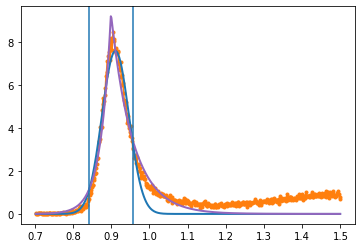

{0.78468782273846515718,0.89928383320278337809,0.00000014380547676372,36.66896492571169829944,17.54715039559681954984,}


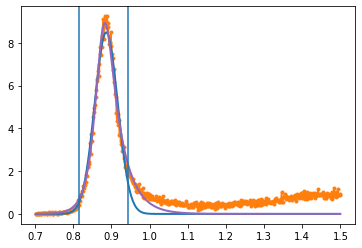

{0.71737815423702833151,0.87885008489875215965,0.01302702975179128968,48.48466507727296459507,26.91503574556059419365,}


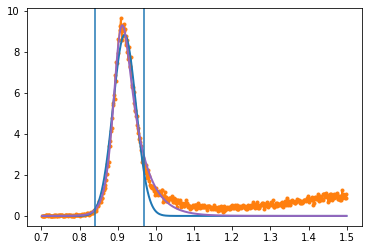

{0.74281594853427168612,0.90531115074443313517,0.01321085255473386857,63.70025317257879038380,24.58002920376507915989,}


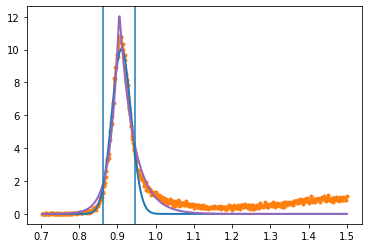

{0.74332174374044213128,0.90494386546207239430,0.00000000781498520798,44.66448286815372625824,26.43417270789913686713,}


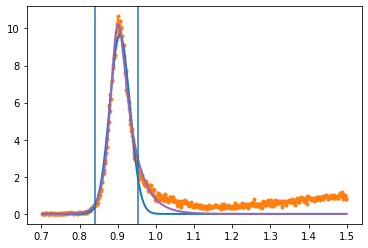

{0.71992196126142504742,0.89678417186923764515,0.01061886064854950136,61.02656386547494804518,28.08885209199917198930,}


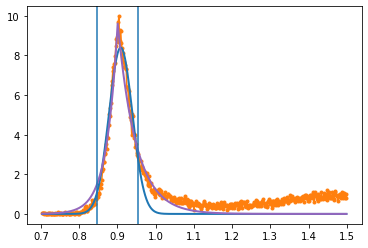

{0.74553828929209764453,0.90068088870730078632,0.00000002985865307629,34.33914234630432815720,20.64288062100192533421,}


In [5]:
data = mm_cut(df)
all_data = pd.concat(data)

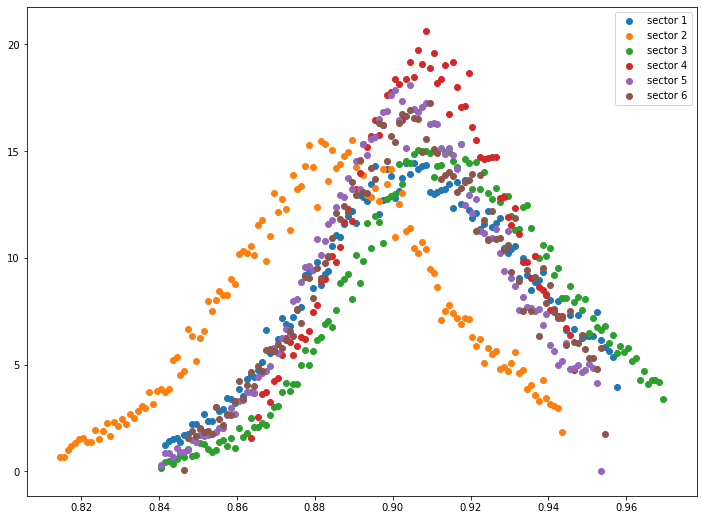

In [6]:
plt.figure(figsize=(12,9))
for i in range(0,6):
    y, x = np.histogram(data[i].mm2, bins=200, density=True, range=(0.8, 1.0))
    x = (x[1:]+x[:-1])/2
    plt.scatter(x[y!=0], y[y!=0], label=f'sector {i+1}')
plt.legend()
plt.show()

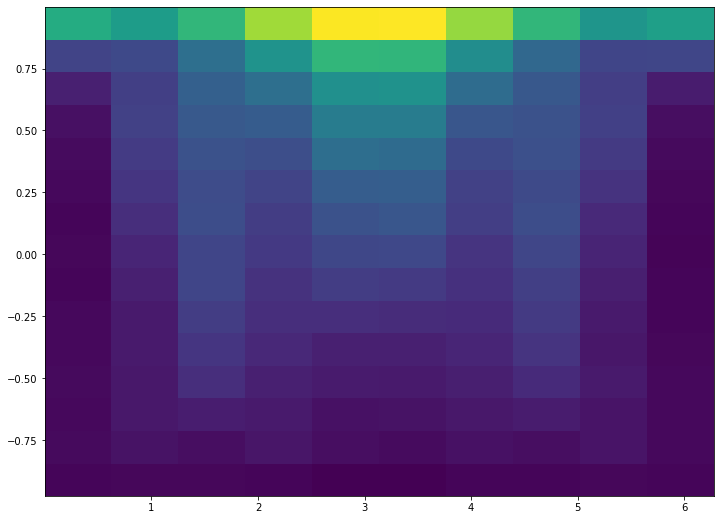

In [7]:
plt.figure(figsize=(12,9))
plt.hist2d(all_data.phi, all_data.cos_theta, bins=(10,15))
plt.show()

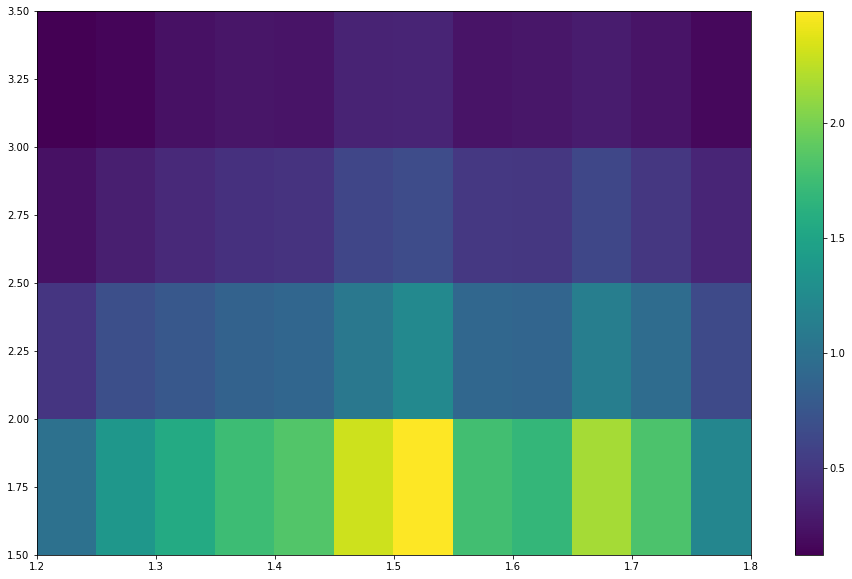

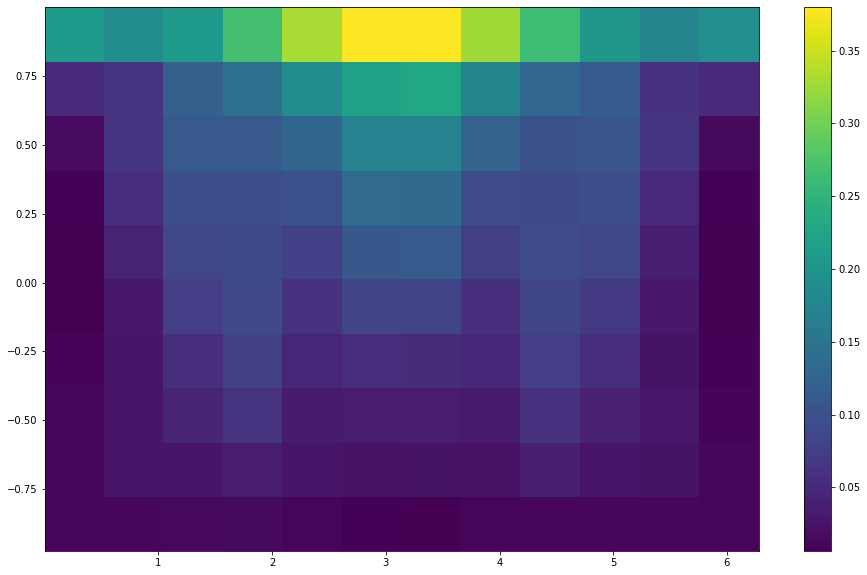

In [8]:
NUM_BINS_W = 12
NUM_BINS_Q2 = 4
NUM_BINS_PHI = 12
NUM_BINS_CT = 10

W_MIN = 1.2
W_MAX = 1.8
Q2_MIN = 1.5
Q2_MAX = 3.5



plt.figure(figsize=(16,10))
counts, w_bins, q2_bins, mesh = plt.hist2d(all_data.w,all_data.q2, 
                                           bins=(NUM_BINS_W, NUM_BINS_Q2), 
                                           range=((W_MIN, W_MAX),(Q2_MIN, Q2_MAX)), 
                                           density=True)
plt.colorbar()
plt.show()

plt.figure(figsize=(16,10))
counts, phi_bins, theta_bins, mesh = plt.hist2d(all_data.phi, all_data.cos_theta, 
                                                bins=(NUM_BINS_PHI, NUM_BINS_CT), 
                                                density=True)
plt.colorbar()
plt.show()

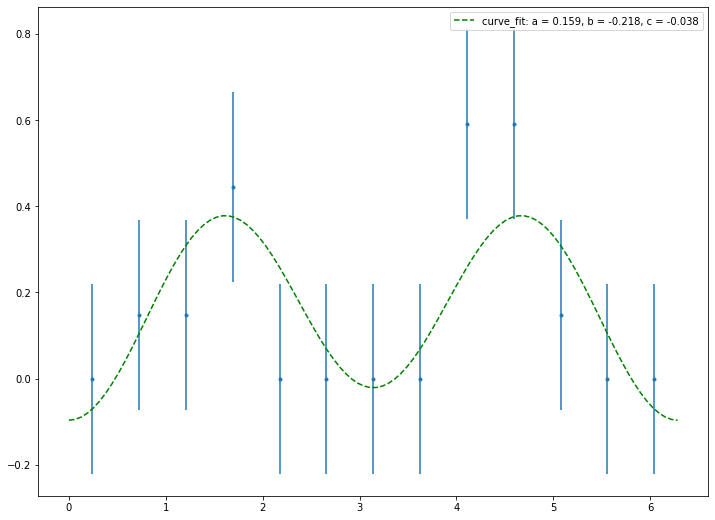

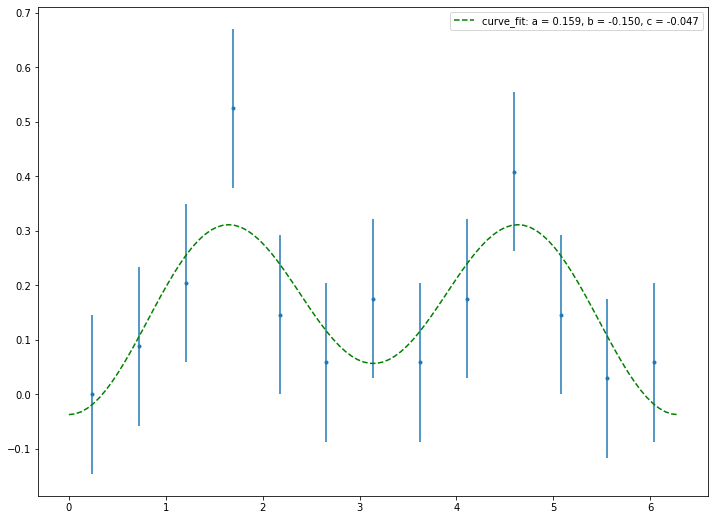

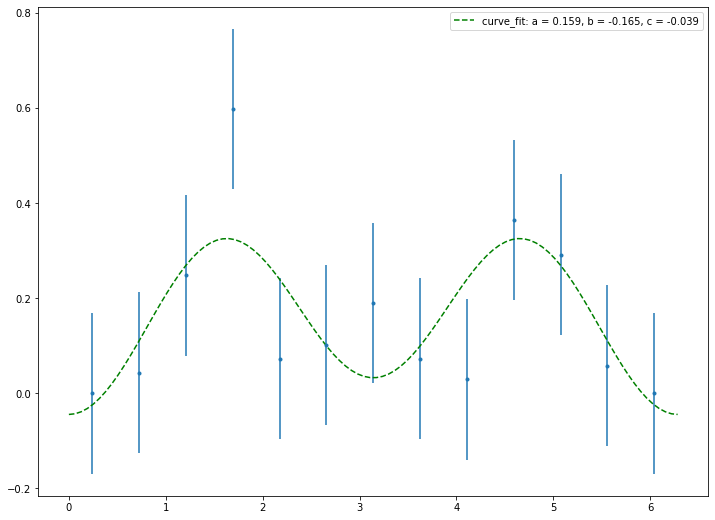

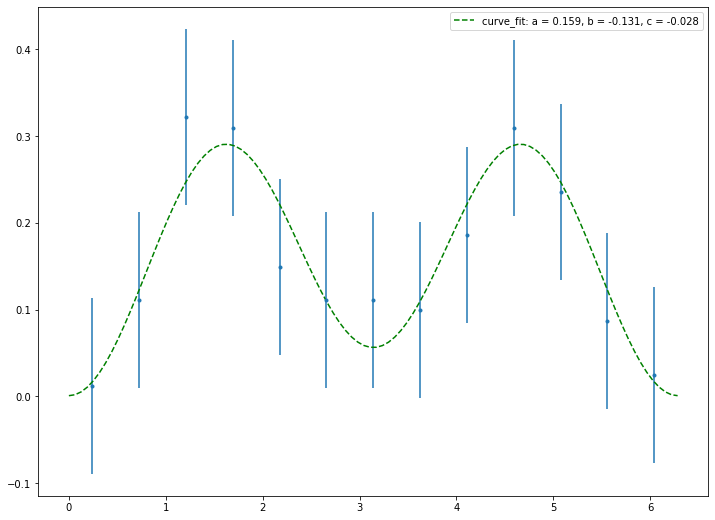

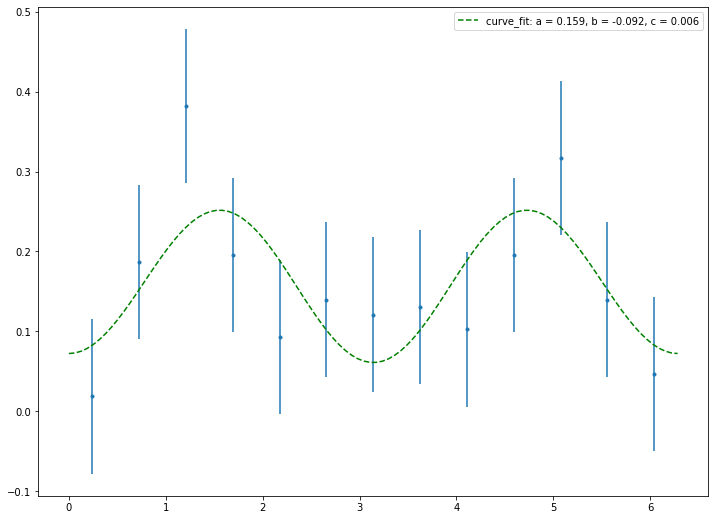

...

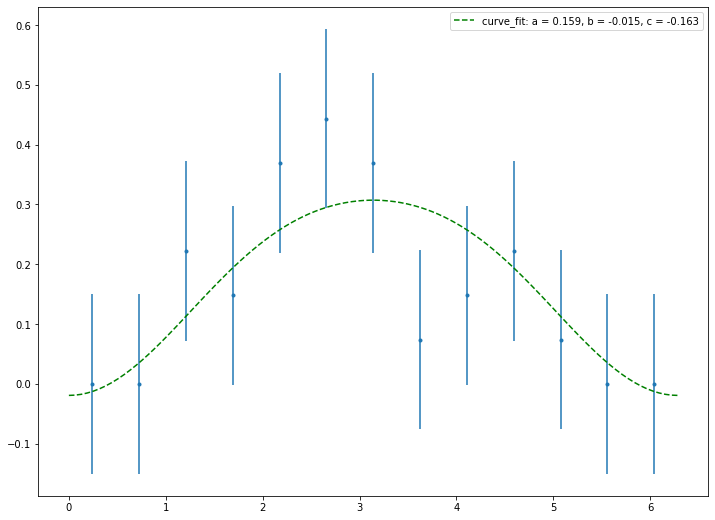

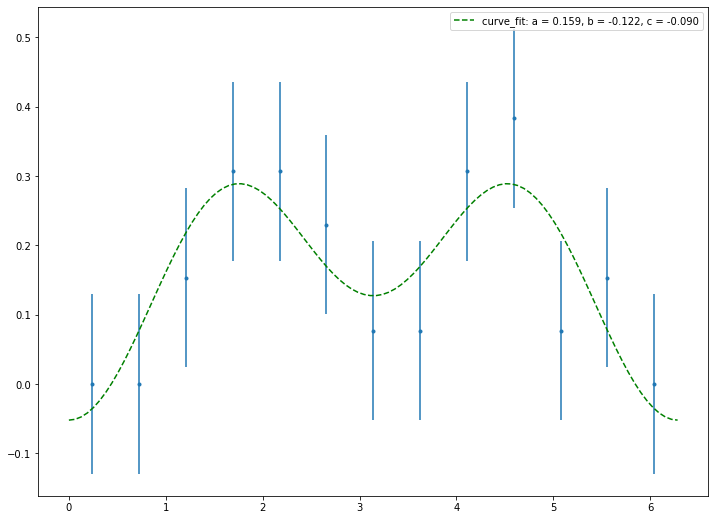

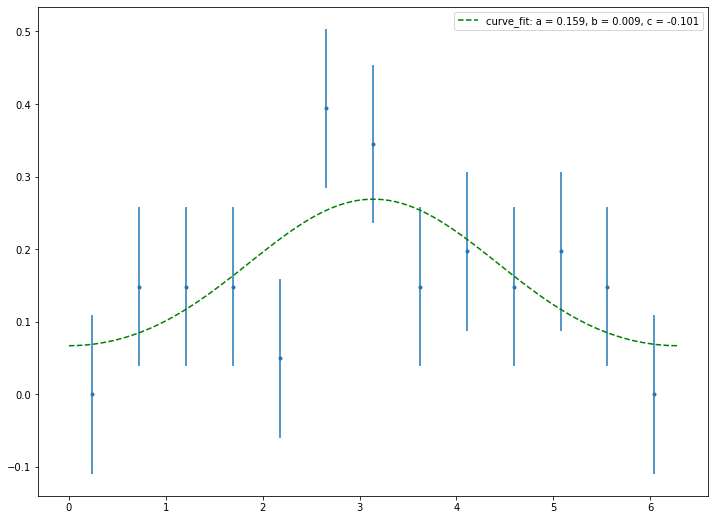

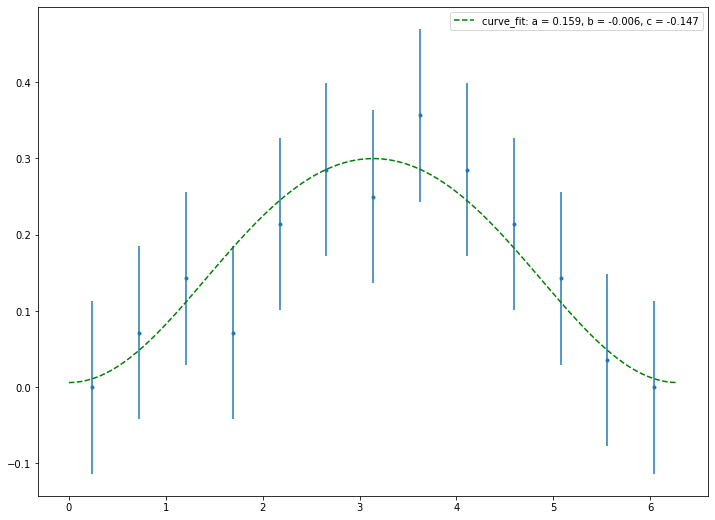

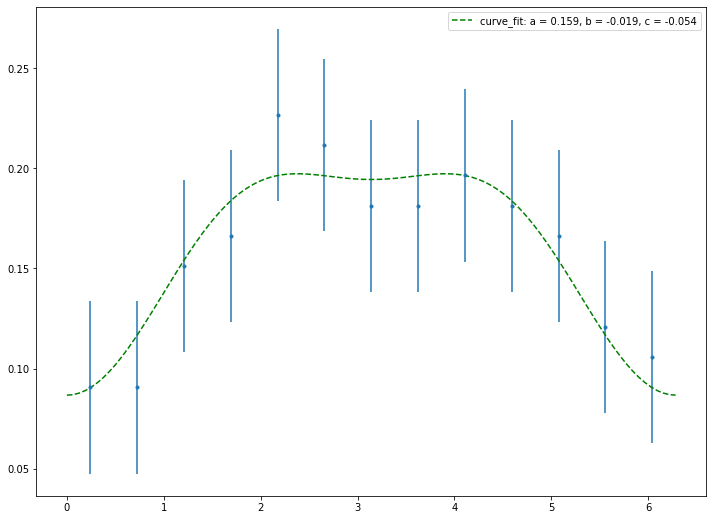

In [9]:
count = 0
for w in range(len(w_bins[:-1])):
    for q2 in range(len(q2_bins[:-1])):
        for cos_t in range(len(theta_bins[:-1])):
            fig = plt.figure(figsize=(12,9))
            count += 1
            # print(f'{theta_bins[cos_t]:0.3f}->{theta_bins[cos_t+1]:0.3f}, {w_bins[w]:0.3f}->{w_bins[w+1]:0.3f}, {q2_bins[q2]:0.3f}->{q2_bins[q2+1]:0.3f}')
            recon = all_data[(all_data.w >= w_bins[w])&
                         (all_data.w < w_bins[w+1])&

                         (all_data.q2 >= q2_bins[q2])&
                         (all_data.q2 < q2_bins[q2+1])&
                         
                         (all_data.cos_theta >= theta_bins[cos_t])&
                         (all_data.cos_theta < theta_bins[cos_t+1])
                        ]
            y, x = np.histogram(recon.phi, bins=len(phi_bins), range=(np.min(phi_bins), np.max(phi_bins)), density=True)
            x = (x[:-1] + x[1:])/ 2.0
            p0 = [np.mean(y), 1.0, 1.0]
            
            popt, pcov = curve_fit(func, x, y, p0=p0, maxfev=800)
            a = popt[0]
            b = popt[1]
            c = popt[2]
            xs = np.linspace(0, 2*np.pi, 100)
            plt.plot(xs, func(xs, *popt), 'g--', 
                                 label=f'curve_fit: a = {a:0.3f}, b = {b:0.3f}, c = {c:0.3f}')
                        
            
            plt.errorbar(x, y, yerr=np.std(y), fmt='.')
            #plt.ylim(0,0.5)
            plt.legend()
            plt.show()
